In [4]:
import pandas as pd
from itertools import combinations
import math
import numpy as np
import statistics
from itertools import permutations
from bioinfokit import analys, visuz
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import uniform, randint
from matplotlib_venn import venn2
import copy
import random
from vst_function import *
from stattools.resampling import PermutationTest

In [5]:
#pd.set_option('display.max_rows', 400)
data = pd.read_csv("../call_cnvr_cnvnator/individual_cnv_cnvr.txt", sep='\t')


anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1',  index_col=1)

distribution = data[data['Length'] < 200000]
data = data.dropna()#.describe()
data

,Chr,Start,End,CNVR_ID,Sample_ID,CNV_Start,CNV_End,CNV_Value,Length
0,1,176101.0,355800.0,CNVR_1,LP6005441-DNA_A01,231001,237900,2,6900.0
1,1,449901.0,564900.0,CNVR_2,LP6005441-DNA_A01,471201,551200,0,80000.0
2,1,665601.0,843800.0,CNVR_3,LP6005441-DNA_A01,723801,728100,1,4300.0
3,1,1007801.0,1015200.0,CNVR_5,LP6005441-DNA_A01,1010901,1014200,0,3300.0
4,1,3995301.0,4237400.0,CNVR_15,LP6005441-DNA_A01,4124201,4127700,0,3500.0
...,...,...,...,...,...,...,...,...,...
229289,9,136453701.0,136980500.0,CNVR_4723,SS6004480,136624701,136626300,0,1600.0
229290,9,137097701.0,138417800.0,CNVR_4724,SS6004480,138214101,138217600,0,3500.0
229291,9,138418601.0,138480200.0,CNVR_4725,SS6004480,138479101,138480200,0,1100.0
229292,9,140061601.0,140064800.0,CNVR_4732,SS6004480,140061701,140064400,0,2700.0


In [6]:
## input for CNVRanger 
#cnvranger = data[['Sample_ID','Chromosome', 'Start', 'End','RD']]
#cnvranger.columns=['Sample_ID','Chr', 'Start', 'End','CNV_Value']
#cnvranger['CNV_Value'] = cnvranger['CNV_Value'].astype(int)
#cnvranger.to_csv('../data/cnvnator_cnvranger_input.csv',  index=False)

In [7]:
data = pd.read_csv("../call_cnvr_cnvnator/individual_cnv_cnvr.txt", sep='\t')
data.columns = ['Chromosome', 'Start', 'End','CNVR','Sample_ID','CNV_Start', 'CNV_End', 'RD', 'Lenght']
data = data.dropna()#.describe()
data

,Chromosome,Start,End,CNVR,Sample_ID,CNV_Start,CNV_End,RD,Lenght
0,1,176101.0,355800.0,CNVR_1,LP6005441-DNA_A01,231001,237900,2,6900.0
1,1,449901.0,564900.0,CNVR_2,LP6005441-DNA_A01,471201,551200,0,80000.0
2,1,665601.0,843800.0,CNVR_3,LP6005441-DNA_A01,723801,728100,1,4300.0
3,1,1007801.0,1015200.0,CNVR_5,LP6005441-DNA_A01,1010901,1014200,0,3300.0
4,1,3995301.0,4237400.0,CNVR_15,LP6005441-DNA_A01,4124201,4127700,0,3500.0
...,...,...,...,...,...,...,...,...,...
229289,9,136453701.0,136980500.0,CNVR_4723,SS6004480,136624701,136626300,0,1600.0
229290,9,137097701.0,138417800.0,CNVR_4724,SS6004480,138214101,138217600,0,3500.0
229291,9,138418601.0,138480200.0,CNVR_4725,SS6004480,138479101,138480200,0,1100.0
229292,9,140061601.0,140064800.0,CNVR_4732,SS6004480,140061701,140064400,0,2700.0


<Axes: >

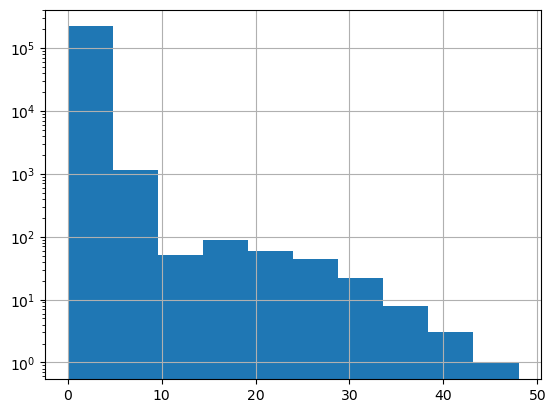

In [77]:
## Filter by chromosomes
#data_x = distribution[distribution.Chromosome == 'X']
#data_no_sex_chr = distribution[distribution.Chromosome != 'Y']
#data = data_no_sex_chr[data_no_sex_chr.Chromosome != 'X']

#data = data[data['GAUSSIAN-EVAL'] < 0.05]
data['RD'].hist(log=True)

NameError: name 'data_no_sex_chr' is not defined

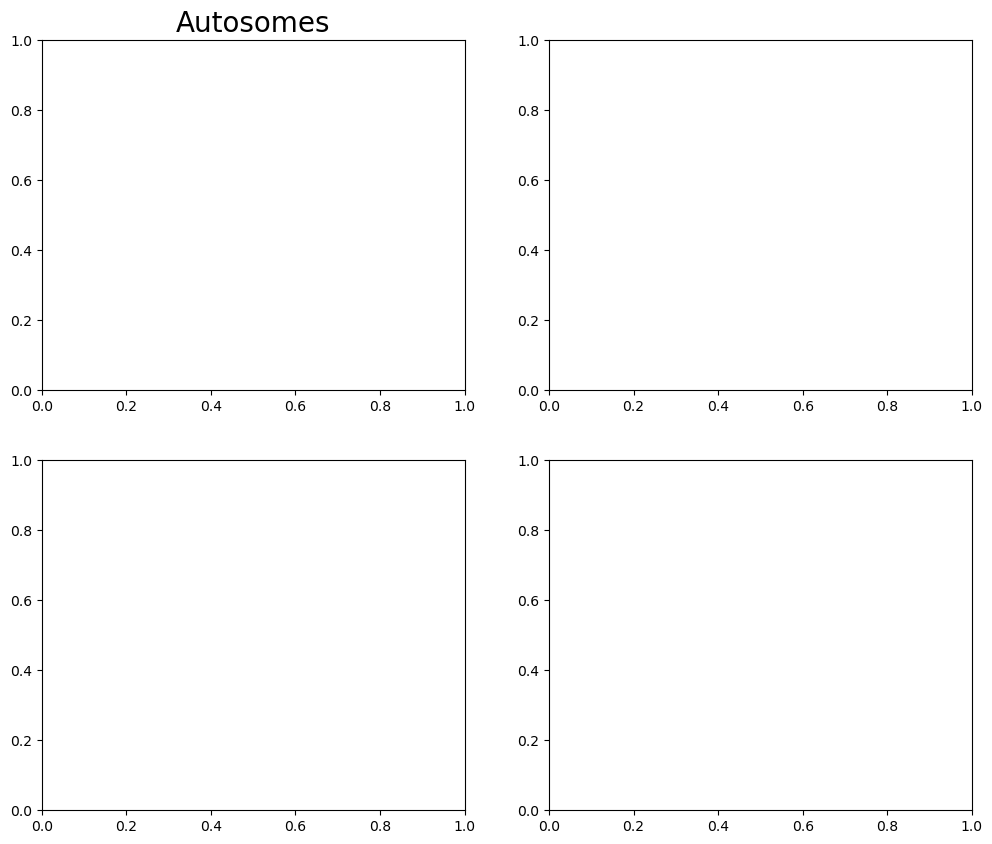

In [9]:
fig, axs = plt.subplots(2,2)
fig.set_size_inches(12, 10, forward=True)

axs[0, 0].set_title('Autosomes', size=20)

df = data_no_sex_chr.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=200, legend=True, ax=axs[0,0], xlabel='Size', alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


df = data_no_sex_chr.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=200, logx=True, ax=axs[1,0], alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


#fig.suptitle
axs[0, 1].set_title('Chr X', size=20)

df = data_x.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=100, ax=axs[0,1], alpha=0.5) # alpha for transparency

#plt.show()

df = data_x.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=100,logx=True, ax=axs[1,1], alpha=0.5) # alpha for transparency


fig.tight_layout() 
#plt.savefig('../plots/distribution.png', transparent=True)
plt.show()

In [78]:
## ADDING DUPLICATION/DELETION COLUMN 
deletions = data[data['RD'] < 2 ] 
deletions['Type'] = 'deletion'
duplications= data[data['RD'] > 2] 
duplications['Type'] = 'duplication'

frames = [deletions,duplications]

data = pd.concat(frames)
data

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30583/2847163872.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deletions['Type'] = 'deletion'
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30583/2847163872.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  duplications['Type'] = 'duplication'


,Chromosome,Start,End,CNVR,Sample_ID,CNV_Start,CNV_End,RD,Lenght,Type
1,1,449901.0,564900.0,CNVR_2,LP6005441-DNA_A01,471201,551200,0,80000.0,deletion
2,1,665601.0,843800.0,CNVR_3,LP6005441-DNA_A01,723801,728100,1,4300.0,deletion
3,1,1007801.0,1015200.0,CNVR_5,LP6005441-DNA_A01,1010901,1014200,0,3300.0,deletion
4,1,3995301.0,4237400.0,CNVR_15,LP6005441-DNA_A01,4124201,4127700,0,3500.0,deletion
5,1,13219701.0,13781900.0,CNVR_39,LP6005441-DNA_A01,13472301,13657600,0,185300.0,deletion
...,...,...,...,...,...,...,...,...,...,...
229139,7,56429901.0,56449500.0,CNVR_3723,SS6004480,56437901,56442400,15,4500.0,duplication
229141,7,56864301.0,56911300.0,CNVR_3728,SS6004480,56886501,56889100,4,2600.0,duplication
229258,9,66454701.0,66863300.0,CNVR_4607,SS6004480,66454701,66501200,3,46500.0,duplication
229267,9,67984701.0,68513900.0,CNVR_4608,SS6004480,68412001,68421300,6,9300.0,duplication


In [82]:
cnv = data.pivot_table(index=["Chromosome", "Start", "End", "Type"], 
                    columns='Sample_ID', 
                    values='RD').reset_index()
cnv = cnv.fillna(2)
cnv['Chromosome'] = 'chr' + cnv['Chromosome'].astype(str)
cnv['Start'] = cnv['Start'].astype(int)
cnv['End'] = cnv['Start'].astype(int)
#cnv.to_csv('../data/grch37_candidates_cnvr.csv', index=False)
coordinates = cnv.iloc[:,0:3]
coordinates.to_csv('../data/grch37_cnvr_coordinates.bed', sep='\t', header=False, index=False)
cnv

Sample_ID,Chromosome,Start,End,Type,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,...,SS6004471,SS6004472,SS6004473,SS6004474,SS6004475,SS6004476,SS6004477,SS6004478,SS6004479,SS6004480
0,chr1,176101,176101,deletion,2.0,0.0,0.0,1.0,1.0,0.5,...,1.0,0.25,1.0,0.5,0.5,2.0,0.0,0.0,1.0,1.0
1,chr1,449901,449901,deletion,0.0,0.5,0.0,0.0,0.0,0.0,...,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,chr1,665601,665601,deletion,1.0,2.0,2.0,2.0,2.0,2.0,...,1.0,1.00,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0
3,chr1,665601,665601,duplication,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.00,3.0,2.0,3.0,3.0,2.0,3.0,2.0,2.0
4,chr1,891701,891701,deletion,2.0,2.0,2.0,2.0,2.0,2.0,...,0.0,0.00,2.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7835,chr9,140136301,140136301,deletion,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,2.00,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
7836,chr9,140197201,140197201,deletion,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,2.00,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
7837,chr9,140245301,140245301,deletion,0.0,0.0,0.0,0.0,0.0,2.0,...,1.0,0.00,2.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0
7838,chr9,140387601,140387601,deletion,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,2.00,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [83]:
coordinates = cnv.iloc[:,0:2]
cnvs = cnv.iloc[:,4:284]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

,0,1,2,3,4,5,6,7,8,9,...,7830,7831,7832,7833,7834,7835,7836,7837,7838,7839
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.0,0.0,1.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A03,0.0,0.5,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A04,0.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A05,1.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A06,1.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,2.0,0.0,1.0,3.0,0.0,0.0,0.0,2.0,2.0,2.0,...,0.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
SS6004477,0.0,0.0,1.0,2.0,2.0,1.0,0.0,2.0,1.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004478,0.0,0.0,1.0,3.0,0.0,2.0,0.0,2.0,2.0,2.0,...,0.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0


In [84]:
features = anotation.loc[:,["7-Gender","10-Region", "11-Country",]]
dt = features.merge(cnvs, left_index=True, right_index=True)
dt


,7-Gender,10-Region,11-Country,0,1,2,3,4,5,6,...,7830,7831,7832,7833,7834,7835,7836,7837,7838,7839
LP6005443-DNA_B06,F,WestEurasia,Iceland,0.0,0.0,2.0,2.0,2.0,0.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005442-DNA_D08,F,WestEurasia,Iceland,1.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_D07,F,SouthAsia,Pakistan,0.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_C07,M,SouthAsia,Pakistan,1.0,0.0,2.0,2.0,2.0,0.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005442-DNA_G11,M,Africa,SierraLeone,1.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6005441-DNA_H10,F,WestEurasia,Russia,0.0,0.0,1.0,2.0,2.0,0.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005519-DNA_A06,M,EastAsia,Myanmar,0.0,0.0,2.0,2.0,2.0,0.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005519-DNA_B06,M,EastAsia,Myanmar,0.0,0.0,2.0,2.0,2.0,0.0,2.0,...,2.0,0.0,2.0,2.0,2.0,0.0,2.0,0.0,2.0,2.0
LP6005441-DNA_B08,F,Africa,Congo,0.5,0.0,2.0,2.0,2.0,0.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [85]:
####### Groupby regions #######
dt_group = dt.groupby('10-Region')

dt_groupped = []
regions = anotation['10-Region'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['10-Region'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])
    

for j in dt_groupped:
    j.drop(columns=['10-Region', '11-Country', '7-Gender'], inplace=True)

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30583/3472590410.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j.drop(columns=['10-Region', '11-Country', '7-Gender'], inplace=True)
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30583/3472590410.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j.drop(columns=['10-Region', '11-Country', '7-Gender'], inplace=True)
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30583/3472590410.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.

In [86]:

dt_groupped

[                   0     1     2     3     4     5     6     7     8     9     \
 LP6005443-DNA_B06   0.0   0.0   2.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 LP6005442-DNA_D08   1.0   0.0   2.0   2.0   2.0   2.0   2.0   2.0   2.0   2.0   
 LP6005442-DNA_C02   1.0   0.0   2.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 LP6005442-DNA_D02   1.0   0.0   1.0   2.0   2.0   2.0   2.0   2.0   2.0   2.0   
 LP6005442-DNA_F04   0.5   0.0   2.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 ...                 ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
 LP6005443-DNA_A06   0.5   0.0   2.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 LP6005441-DNA_H12   1.0   0.0   2.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 LP6005441-DNA_G10   1.0   0.0   2.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 LP6005441-DNA_H10   0.0   0.0   1.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 LP6005592-DNA_G01   1.0   0.0   2.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 
              

In [87]:
## VST for pair-population
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = vst_function((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
#vst_dt = vst_dt.T
vst_dt


,0,1,2,3,4,5,6,7,8,9,...,7830,7831,7832,7833,7834,7835,7836,7837,7838,7839
WestEurasia-SouthAsia,0.001854,0.012475,0.000381,NaN,0.019340,0.000166,0.007902,0.004706,NaN,0.001912,...,0.013282,1.349210e-02,NaN,0.004706,1.437346e-02,0.005712,NaN,0.003648,0.009496,0.009496
WestEurasia-Africa,0.000306,0.005082,0.000665,2.899687e-02,0.000836,0.004863,0.013093,0.005082,0.014375,0.005082,...,0.004969,2.170727e-03,0.014375,0.001191,1.391577e-04,0.008995,0.014375,0.176242,0.019555,0.000174
WestEurasia-CentralAsiaSiberia,0.003654,0.003649,0.044668,NaN,0.001405,0.014167,0.003267,0.003649,NaN,0.003649,...,0.010319,4.012436e-02,NaN,0.003649,1.116933e-02,0.005890,NaN,0.002047,0.007371,0.007371
WestEurasia-Oceania,0.031569,0.007332,0.003019,3.178694e-02,0.002758,0.000936,0.008136,0.003344,0.031787,0.007332,...,0.000360,1.788458e-02,NaN,0.003344,5.990033e-06,0.004331,NaN,0.001975,0.006757,0.006757
WestEurasia-America,0.001734,0.003129,0.001814,3.540670e-02,0.004095,0.035348,0.001424,0.003129,NaN,0.003129,...,0.013701,1.215486e-02,NaN,0.003129,1.068262e-04,0.019820,NaN,0.001069,0.011864,0.006325
WestEurasia-EastAsia,0.011619,0.000976,0.000920,2.726603e-02,0.000536,0.000002,0.001281,0.005224,NaN,0.005224,...,0.001307,1.404390e-02,NaN,0.005224,2.593298e-03,0.002165,0.013518,0.025601,0.010536,0.010536
SouthAsia-Africa,0.004616,0.027857,0.000048,2.188552e-02,0.033239,0.003566,0.039544,NaN,0.010809,0.013759,...,0.032678,5.730907e-03,0.010809,0.010809,2.188552e-02,0.031898,0.010809,0.205930,0.030691,0.010809
SouthAsia-CentralAsiaSiberia,0.012278,0.021635,0.054026,NaN,0.045139,0.015385,0.001068,NaN,NaN,0.010651,...,NaN,1.235043e-02,NaN,NaN,NaN,0.024311,NaN,0.012934,NaN,NaN
SouthAsia-Oceania,0.024686,0.000481,0.006838,2.620968e-02,0.053279,0.000473,0.039154,NaN,0.026210,0.001970,...,0.026210,1.229589e-03,NaN,NaN,2.620968e-02,0.020496,NaN,0.000133,NaN,NaN
SouthAsia-America,0.007558,0.019122,0.000897,2.954545e-02,0.060092,0.046742,0.021006,NaN,NaN,0.009402,...,0.060092,9.972202e-05,NaN,NaN,2.954545e-02,0.050366,NaN,0.000599,0.029545,NaN


In [88]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst



,29,30,44,67,169,170,171,202,211,228,...,7782,7784,7790,7812,7813,7818,7822,7825,7826,7837
WestEurasia-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Africa,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,True,False,False,False,False
WestEurasia-CentralAsiaSiberia,True,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Oceania,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,True,False,False,False,False
WestEurasia-America,True,True,False,False,True,False,True,False,False,True,...,False,False,False,False,True,False,False,False,False,False
WestEurasia-EastAsia,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,True,False,False,False,False
SouthAsia-Africa,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,True,True
SouthAsia-CentralAsiaSiberia,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-Oceania,False,False,False,True,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-America,True,False,False,False,True,False,False,False,False,True,...,False,False,False,False,True,False,False,False,False,False


In [89]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'chr', cnv['Chromosome'])
vst_dt.insert (1, 'start', cnv['Start'])
vst_dt.insert (2, 'end', cnv['End'])
#vst_dt.insert (3, 'type', cnv['Type'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,chr1,176101,176101,0.00185,0.00031,0.00365,0.03157,0.00173,0.01162,0.00462,...,0.00296,0.04847,0.00113,0.01980,0.05891,0.00023,0.03052,0.04620,0.01144,0.02116
1,chr1,449901,449901,0.01248,0.00508,0.00365,0.00733,0.00313,0.00098,0.02786,...,0.00000,0.02736,0.00000,0.01075,0.02250,0.00000,0.00815,0.02037,0.00322,0.00714
2,chr1,665601,665601,0.00038,0.00067,0.04467,0.00302,0.00181,0.00092,0.00005,...,0.04104,0.00687,0.00047,0.00301,0.10623,0.03556,0.06225,0.01140,0.00078,0.00500
3,chr1,665601,665601,0.00000,0.02900,0.00000,0.03179,0.03541,0.02727,0.02189,...,0.01779,0.00008,-0.00000,0.00002,0.02250,0.02557,0.01653,0.00009,0.00002,0.00002
4,chr1,891701,891701,0.01934,0.00084,0.00140,0.00276,0.00410,0.00054,0.03324,...,0.00012,0.00077,0.00164,0.00004,0.00030,0.00094,0.00029,0.00018,0.00111,0.00212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7835,chr9,140136301,140136301,0.00571,0.00900,0.00589,0.00433,0.01982,0.00216,0.03190,...,0.00007,0.00041,0.01402,0.02165,0.00014,0.01698,0.01586,0.02037,0.01292,0.03796
7836,chr9,140197201,140197201,0.00000,0.01437,0.00000,0.00000,0.00000,0.01352,0.01081,...,0.00877,0.00814,0.00769,0.00001,0.00000,0.00000,0.00815,0.00000,0.00756,0.00714
7837,chr9,140245301,140245301,0.00365,0.17624,0.00205,0.00197,0.00107,0.02560,0.20593,...,0.12055,0.16862,0.15589,0.28916,0.01008,0.00754,0.05315,0.00018,0.01708,0.02080
7838,chr9,140387601,140387601,0.00950,0.01955,0.00737,0.00676,0.01186,0.01054,0.03069,...,0.02499,0.02323,0.00062,0.03329,0.00000,0.02557,0.00000,0.02424,0.00000,0.03121


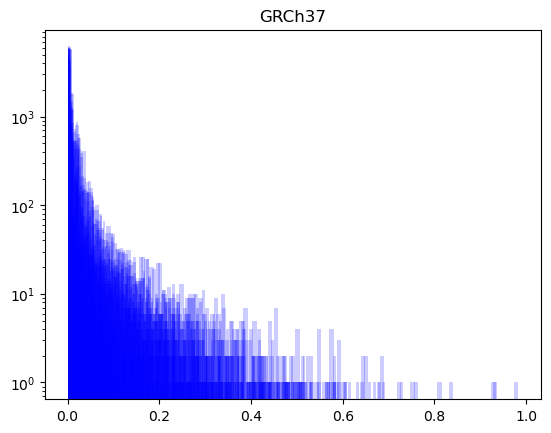

In [90]:
#sns.set_palette("bright")
for i in vst_dt.iloc[:,3:25].columns:
    plt.hist(vst_dt[i], bins=100, alpha=0.2, log=True, color="blue")
    plt.title('GRCh37')

/Users/luciabazan/anaconda3/lib/python3.11/site-packages/pandas/plotting/_matplotlib/tools.py:227: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


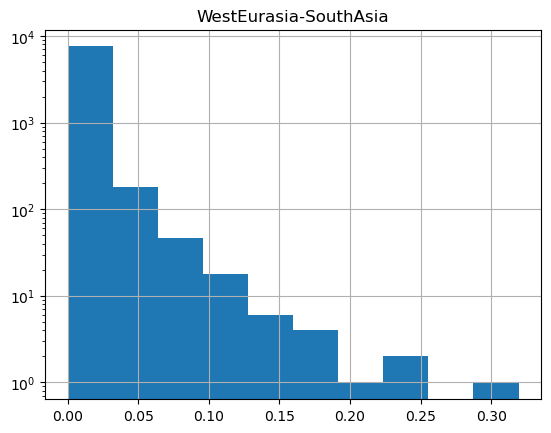

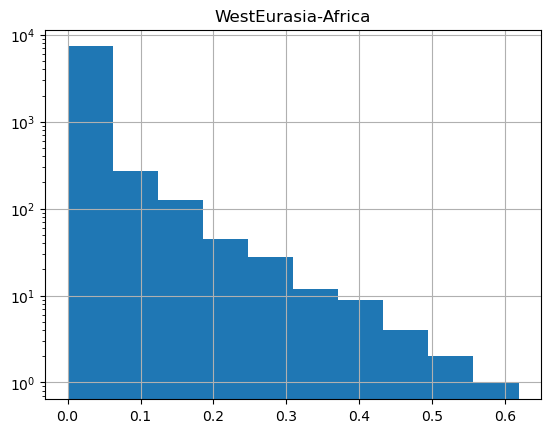

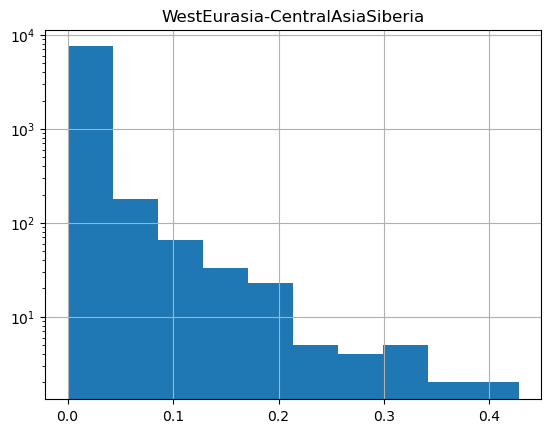

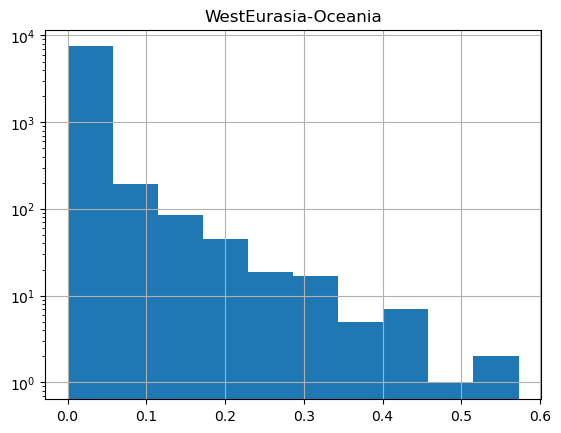

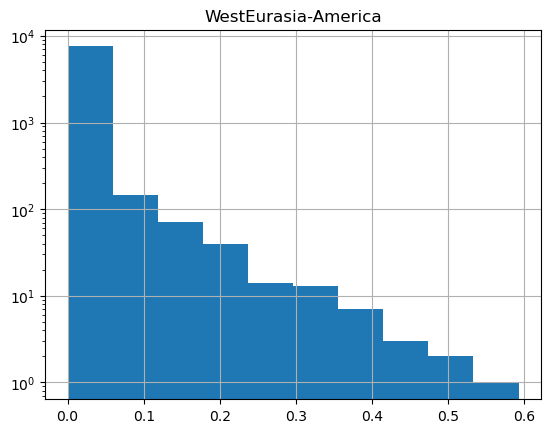

...

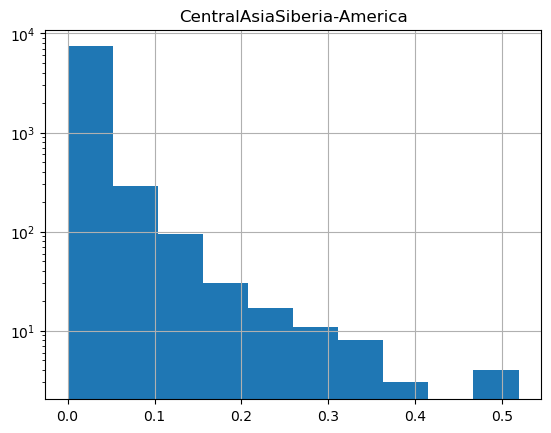

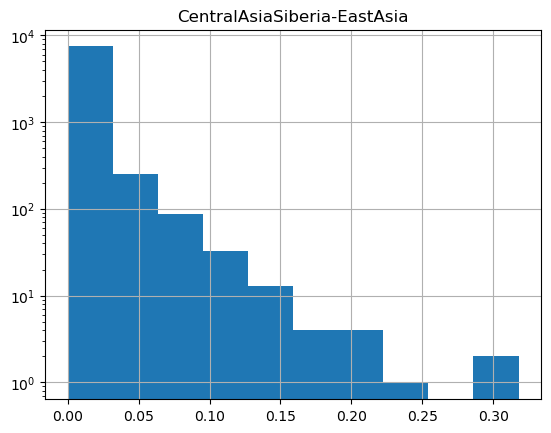

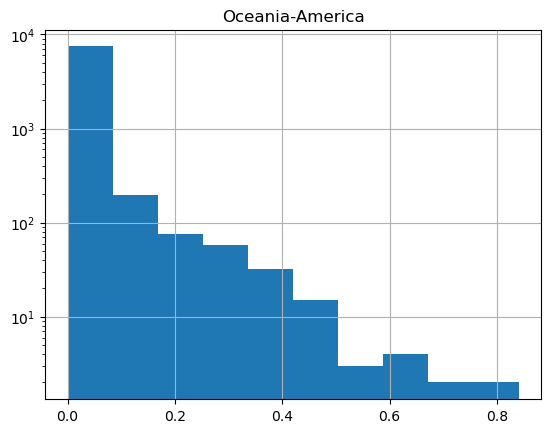

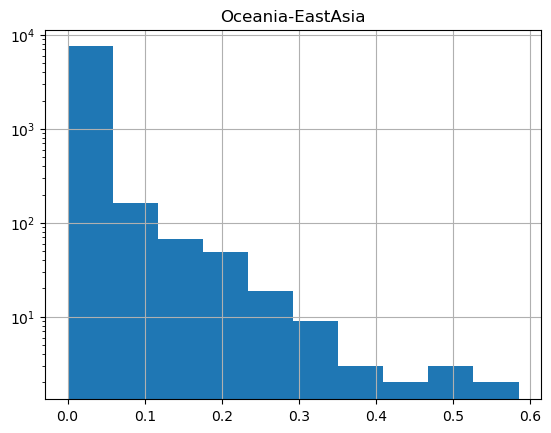

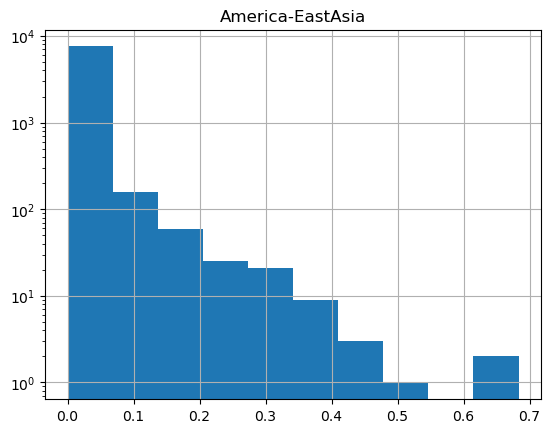

In [91]:
for col in vst_dt.iloc[:,3:25].columns: 
    try:      
        vst_dt.iloc[:,3:25][col] = pd.to_numeric(vst_dt.iloc[:,3:25][col]) 
        vst_dt.iloc[:,3:25].hist(column=col, log=True)
    except ValueError:
        print('This column can not be represented as a histogram')

In [30]:
chr8 = vst_dt[vst_dt['chr'] == '8']
chr8[chr8['start'] > 22700000].sort_values(by='start', ascending=True).head(50)

,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia


In [92]:
vst_dt_filtering_location = vst_dt.iloc[filtering_vst.columns]
vst_dt_filtering_location#[vst_dt_filtering_location['chr'] == '8'].sort_values(by='WestEurasia-Oceania', ascending=False).head(50)

,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
29,chr1,8360201,8360201,0.00000,0.00000,0.23576,0.00000,0.39112,0.00000,0.00000,...,0.20694,0.00000,0.35714,0.00000,0.16537,0.02666,0.20969,0.30303,0.00000,0.36050
30,chr1,9846201,9846201,0.07167,0.01025,0.01140,0.00134,0.25416,0.02870,0.10391,...,0.04724,0.02736,0.31579,0.05627,0.00473,0.15949,0.00322,0.19800,0.01292,0.12079
44,chr1,16150401,16150401,0.00041,0.08380,0.13144,0.03128,0.02458,0.12031,0.10320,...,0.01514,0.22571,0.01291,0.00405,0.36782,0.06077,0.00396,0.15333,0.28087,0.03045
67,chr1,24377601,24377601,0.00854,0.15839,0.02047,0.13059,0.12174,0.01070,0.13545,...,0.10554,0.65039,0.00769,0.27255,0.32327,0.11370,0.06462,0.64506,0.09120,0.22873
169,chr1,62113301,62113301,0.01813,0.02305,0.07596,0.01532,0.21904,0.01040,0.00028,...,0.20023,0.09094,0.42187,0.06680,0.02488,0.05635,0.03559,0.15222,0.00108,0.16199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7818,chr9,131183401,131183401,0.04238,0.20507,0.04905,0.26372,0.10135,0.25317,0.07324,...,0.05986,0.00249,0.02334,0.00471,0.09642,0.01010,0.08929,0.04593,0.00025,0.04388
7822,chr9,134074401,134074401,0.00000,0.00135,0.00000,0.04823,0.17814,0.00046,0.00126,...,0.00112,0.06377,0.20562,0.00306,0.04748,0.17758,0.00040,0.04569,0.03870,0.15935
7825,chr9,136453701,136453701,0.02369,0.07091,0.03114,0.03487,0.05146,0.03490,0.18753,...,0.21297,0.00343,0.26493,0.21177,0.16925,0.00605,0.00007,0.23142,0.14903,0.00646
7826,chr9,137097701,137097701,0.00910,0.14457,0.00573,0.09906,0.05858,0.01582,0.25019,...,0.12100,0.54740,0.01683,0.08765,0.19579,0.04640,0.00178,0.40409,0.21460,0.02621


In [101]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered 

,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia,i
29,chr1,8360201,8360201,0.00000,0.00000,0.23576,0.00000,0.39112,0.00000,0.00000,...,0.00000,0.35714,0.00000,0.16537,0.02666,0.20969,0.30303,0.00000,0.36050,29.0
30,chr1,9846201,9846201,0.07167,0.01025,0.01140,0.00134,0.25416,0.02870,0.10391,...,0.02736,0.31579,0.05627,0.00473,0.15949,0.00322,0.19800,0.01292,0.12079,30.0
44,chr1,16150401,16150401,0.00041,0.08380,0.13144,0.03128,0.02458,0.12031,0.10320,...,0.22571,0.01291,0.00405,0.36782,0.06077,0.00396,0.15333,0.28087,0.03045,44.0
67,chr1,24377601,24377601,0.00854,0.15839,0.02047,0.13059,0.12174,0.01070,0.13545,...,0.65039,0.00769,0.27255,0.32327,0.11370,0.06462,0.64506,0.09120,0.22873,67.0
169,chr1,62113301,62113301,0.01813,0.02305,0.07596,0.01532,0.21904,0.01040,0.00028,...,0.09094,0.42187,0.06680,0.02488,0.05635,0.03559,0.15222,0.00108,0.16199,169.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7818,chr9,131183401,131183401,0.04238,0.20507,0.04905,0.26372,0.10135,0.25317,0.07324,...,0.00249,0.02334,0.00471,0.09642,0.01010,0.08929,0.04593,0.00025,0.04388,7818.0
7822,chr9,134074401,134074401,0.00000,0.00135,0.00000,0.04823,0.17814,0.00046,0.00126,...,0.06377,0.20562,0.00306,0.04748,0.17758,0.00040,0.04569,0.03870,0.15935,7822.0
7825,chr9,136453701,136453701,0.02369,0.07091,0.03114,0.03487,0.05146,0.03490,0.18753,...,0.00343,0.26493,0.21177,0.16925,0.00605,0.00007,0.23142,0.14903,0.00646,7825.0
7826,chr9,137097701,137097701,0.00910,0.14457,0.00573,0.09906,0.05858,0.01582,0.25019,...,0.54740,0.01683,0.08765,0.19579,0.04640,0.00178,0.40409,0.21460,0.02621,7826.0


In [102]:
## Saving Vst coordinates as bed file to liftover

vst_dt_filtered.iloc[:,0:3].to_csv('vst_coordinates_grch37.bed', header=False, index=False,sep='\t')

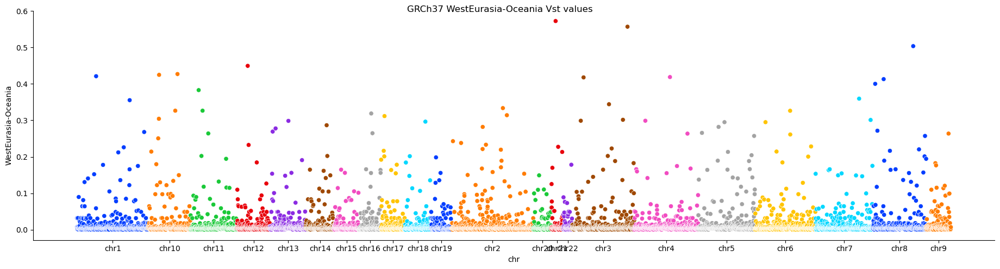

In [95]:
# Simulate DataFrame
#vst_dt['i']= vst_dt.index
vst_dt["i"] = pd.to_numeric(vst_dt.index, downcast="float")

#vst_dt['log_West_Oceania'] = np.log2(vst_dt['WestEurasia-Oceania'])

# Generate Manhattan plot: (#optional tweaks for relplot: linewidth=0, s=9)
plot = sns.relplot(data=vst_dt, x='i', y='WestEurasia-Oceania', aspect=3.7, 
                  hue='chr', palette = 'bright', legend=None) 
chrom_df=vst_dt.groupby('chr')['i'].median()
plot.ax.set_xlabel('chr'); plot.ax.set_xticks(chrom_df);
plot.ax.set_xticklabels(chrom_df.index)
plot.fig.suptitle('GRCh37 WestEurasia-Oceania Vst values');

<h1> Computing permutation 

In [97]:
from stattools.resampling import PermutationTest
PermutationTest

stattools.resampling.permutation.PermutationTest

In [98]:
print("Starting permutation")
### Grouping again 
cnvs_passed_vst = cnvs.T.iloc[filtering_vst.T.index]
cnvs_passed_vst = cnvs_passed_vst.T

dt_cnvs_passed_vst = features.merge(cnvs_passed_vst, left_index=True, right_index=True)
dt_cnvs_passed_vst.head()


Starting permutation


,7-Gender,10-Region,11-Country,29,30,44,67,169,170,171,...,7782,7784,7790,7812,7813,7818,7822,7825,7826,7837
LP6005443-DNA_B06,F,WestEurasia,Iceland,2.0,2.0,2.0,0.0,2.0,2.0,0.0,...,2.0,2.0,0.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0
LP6005442-DNA_D08,F,WestEurasia,Iceland,2.0,2.0,0.0,0.0,2.0,2.0,2.0,...,0.0,2.0,0.0,0.0,2.0,0.0,2.0,2.0,0.0,0.0
LP6005441-DNA_D07,F,SouthAsia,Pakistan,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,0.0,2.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
LP6005441-DNA_C07,M,SouthAsia,Pakistan,2.0,2.0,0.0,2.0,2.0,0.0,2.0,...,2.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,2.0,0.0
LP6005442-DNA_G11,M,Africa,SierraLeone,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0,0.0,0.0


In [99]:
####### Groupby regions #######
dt_group = dt_cnvs_passed_vst.groupby('10-Region')

dt_groupped = []
regions = features['10-Region'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['10-Region'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])
    
dt_groupped[region[0]]

,7-Gender,10-Region,11-Country,29,30,44,67,169,170,171,...,7782,7784,7790,7812,7813,7818,7822,7825,7826,7837
LP6005443-DNA_G11,M,America,Mexico,2.0,0.0,2.0,2.0,0.0,2.0,0.0,...,2.0,2.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0
LP6005443-DNA_H11,F,America,Mexico,0.0,0.0,0.0,2.0,0.0,2.0,0.0,...,2.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0
SS6004479,F,America,Mexico,0.0,2.0,2.0,2.0,0.0,2.0,2.0,...,0.0,2.0,2.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0
LP6005441-DNA_F10,F,America,Mexico,2.0,0.0,0.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
LP6005441-DNA_E10,M,America,Mexico,2.0,0.0,0.0,2.0,0.0,0.0,2.0,...,0.0,2.0,0.5,2.0,0.0,0.0,2.0,0.0,0.0,0.0
LP6005519-DNA_D01,M,America,Argentina,0.0,2.0,0.0,2.0,2.0,2.0,0.0,...,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
SS6004476,M,America,Brazil,0.0,2.0,0.0,2.0,0.0,2.0,2.0,...,0.0,2.0,2.0,2.0,0.0,0.0,0.0,2.0,0.5,0.0
LP6005443-DNA_E11,F,America,Mexico,2.0,2.0,0.0,2.0,0.0,2.0,0.0,...,0.0,2.0,1.0,2.0,0.0,2.0,2.0,2.0,0.0,0.0
LP6005443-DNA_F11,F,America,Mexico,0.0,0.0,2.0,2.0,0.0,0.0,2.0,...,2.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,2.0,0.0
LP6005677-DNA_D01,M,America,Mexico,0.0,2.0,0.0,2.0,0.0,0.0,2.0,...,0.0,2.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0


In [ ]:
p_value_permutation = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2)) 
for region in combination_regions:
    p_value= []
    p_value_permutation.append(p_value)
    
    for i in cnvs_passed_vst.columns:
        permutation = PermutationTest(dt_groupped[region[0]][i], dt_groupped[region[1]][i], stat=vst_function, n_perm=9999)#mean_gt
        p_value.append(permutation.p_value())

In [ ]:
results_permutation = pd.DataFrame(p_value_permutation).set_axis(combination_names)
results_permutation

<h2> Just CNvs that passed permutation 

In [60]:
permutation_pased__vst_chm13 = pd.DataFrame(p_value_permutation).set_axis(combination_names)
# create a process pool that uses all cpus
permutation_pased__vst_chm13.to_csv('../data/permutation_passed_vst_cnvr_grch37.csv')
permutation_pased__vst_chm13

,0,1,2,3,4,5,6,7,8,9,...,444,445,446,447,448,449,450,451,452,453
WestEurasia-SouthAsia,0.0001,0.0033,0.8766,0.3642,0.1595,0.1452,0.1625,0.3340,0.3739,0.8984,...,0.1528,0.5972,0.1455,0.5136,0.4810,0.0145,0.9909,0.1104,0.2841,0.4419
WestEurasia-Africa,0.0001,0.5275,0.0016,0.0001,0.1026,0.0028,0.6130,0.0001,0.3750,0.0089,...,0.0038,0.0006,0.4302,0.0005,0.0002,0.0001,0.7379,0.0059,0.0002,0.0001
WestEurasia-CentralAsiaSiberia,0.0001,0.4923,0.0006,0.1534,0.0114,0.8805,0.0001,0.5229,0.6690,0.4158,...,0.0003,0.1641,0.1437,0.0003,0.0048,0.0604,0.9102,0.0722,0.5164,0.7218
WestEurasia-Oceania,0.0001,0.7483,0.1333,0.0005,0.2366,0.0116,0.0001,0.5417,0.5094,0.4061,...,0.0728,0.0010,0.0011,0.3002,0.0231,0.0001,0.0282,0.0818,0.0011,0.7229
WestEurasia-America,0.0001,0.0001,0.0958,0.0008,0.0001,0.0094,0.0001,0.9775,0.0223,0.0002,...,0.0273,0.1745,0.5026,0.5506,0.0001,0.0101,0.0001,0.0204,0.0208,0.9240
WestEurasia-EastAsia,0.0001,0.0692,0.0002,0.2951,0.2846,0.0034,0.0001,0.2821,0.3272,0.0198,...,0.0001,0.8536,0.3017,0.0034,0.8063,0.0001,0.8917,0.0340,0.2016,0.0797
SouthAsia-Africa,0.0001,0.0016,0.0030,0.0007,0.9486,0.1676,0.1656,0.0011,0.0001,0.0456,...,0.0003,0.0286,0.0219,0.0004,0.0001,0.0140,0.7739,0.0002,0.0001,0.0001
SouthAsia-CentralAsiaSiberia,0.0003,0.1998,0.0003,0.7128,0.0004,0.2392,0.0004,0.2252,0.1366,0.4247,...,0.0368,0.0845,0.8734,0.0030,0.0663,0.7840,0.9638,0.6706,0.2083,0.2648
SouthAsia-Oceania,0.0001,0.0739,0.1005,0.0001,0.0338,0.1195,0.0001,0.2442,0.0001,0.3885,...,0.6031,0.0381,0.0433,0.1133,0.0178,0.0087,0.0575,0.0044,0.0369,0.9373
SouthAsia-America,0.0001,0.0450,0.1278,0.0119,0.0001,0.0013,0.0008,0.9003,0.0006,0.0003,...,0.3555,0.2842,0.0552,0.8365,0.0001,0.4399,0.0004,0.5109,0.0054,0.8617


<h2> CNVs that passed permutation and vst  

In [61]:
results_permutation = pd.read_csv('../data/permutation_passed_vst_cnvr_grch37.csv', index_col=0)
results_permutation

,0,1,2,3,4,5,6,7,8,9,...,444,445,446,447,448,449,450,451,452,453
WestEurasia-SouthAsia,0.0001,0.0033,0.8766,0.3642,0.1595,0.1452,0.1625,0.3340,0.3739,0.8984,...,0.1528,0.5972,0.1455,0.5136,0.4810,0.0145,0.9909,0.1104,0.2841,0.4419
WestEurasia-Africa,0.0001,0.5275,0.0016,0.0001,0.1026,0.0028,0.6130,0.0001,0.3750,0.0089,...,0.0038,0.0006,0.4302,0.0005,0.0002,0.0001,0.7379,0.0059,0.0002,0.0001
WestEurasia-CentralAsiaSiberia,0.0001,0.4923,0.0006,0.1534,0.0114,0.8805,0.0001,0.5229,0.6690,0.4158,...,0.0003,0.1641,0.1437,0.0003,0.0048,0.0604,0.9102,0.0722,0.5164,0.7218
WestEurasia-Oceania,0.0001,0.7483,0.1333,0.0005,0.2366,0.0116,0.0001,0.5417,0.5094,0.4061,...,0.0728,0.0010,0.0011,0.3002,0.0231,0.0001,0.0282,0.0818,0.0011,0.7229
WestEurasia-America,0.0001,0.0001,0.0958,0.0008,0.0001,0.0094,0.0001,0.9775,0.0223,0.0002,...,0.0273,0.1745,0.5026,0.5506,0.0001,0.0101,0.0001,0.0204,0.0208,0.9240
WestEurasia-EastAsia,0.0001,0.0692,0.0002,0.2951,0.2846,0.0034,0.0001,0.2821,0.3272,0.0198,...,0.0001,0.8536,0.3017,0.0034,0.8063,0.0001,0.8917,0.0340,0.2016,0.0797
SouthAsia-Africa,0.0001,0.0016,0.0030,0.0007,0.9486,0.1676,0.1656,0.0011,0.0001,0.0456,...,0.0003,0.0286,0.0219,0.0004,0.0001,0.0140,0.7739,0.0002,0.0001,0.0001
SouthAsia-CentralAsiaSiberia,0.0003,0.1998,0.0003,0.7128,0.0004,0.2392,0.0004,0.2252,0.1366,0.4247,...,0.0368,0.0845,0.8734,0.0030,0.0663,0.7840,0.9638,0.6706,0.2083,0.2648
SouthAsia-Oceania,0.0001,0.0739,0.1005,0.0001,0.0338,0.1195,0.0001,0.2442,0.0001,0.3885,...,0.6031,0.0381,0.0433,0.1133,0.0178,0.0087,0.0575,0.0044,0.0369,0.9373
SouthAsia-America,0.0001,0.0450,0.1278,0.0119,0.0001,0.0013,0.0008,0.9003,0.0006,0.0003,...,0.3555,0.2842,0.0552,0.8365,0.0001,0.4399,0.0004,0.5109,0.0054,0.8617


In [62]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered = vst_dt_filtered.reset_index()
vst_dt_sb = vst_dt_filtered.drop(columns=['chr', 'start','end', 'index'])
vst_dt_sb.describe()



,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,SouthAsia-CentralAsiaSiberia,SouthAsia-Oceania,SouthAsia-America,...,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia,i
count,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,...,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000
mean,0.022980,0.104864,0.053113,0.093317,0.083279,0.075361,0.107232,0.048077,0.088050,0.089452,...,0.145518,0.165218,0.142907,0.105839,0.075947,0.030023,0.155496,0.081795,0.082965,3902.248899
std,0.035926,0.112287,0.072559,0.106442,0.102347,0.098310,0.108307,0.060713,0.096277,0.110720,...,0.150141,0.154935,0.138767,0.117258,0.092641,0.042914,0.150829,0.101243,0.105614,2234.435565
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,28.000000
25%,0.002172,0.014682,0.005450,0.011930,0.006875,0.007315,0.017417,0.004520,0.012387,0.009538,...,0.020222,0.032260,0.026705,0.015975,0.008632,0.002282,0.021420,0.007560,0.007600,2115.250000
50%,0.010005,0.066675,0.023530,0.047750,0.039120,0.035170,0.071170,0.025895,0.056360,0.047720,...,0.104660,0.133575,0.105290,0.060935,0.042735,0.013265,0.121210,0.039930,0.036890,3815.500000
75%,0.028237,0.162605,0.072050,0.150120,0.128155,0.110588,0.175623,0.066110,0.130180,0.131365,...,0.226367,0.258040,0.222548,0.164810,0.108402,0.038360,0.253252,0.128578,0.123990,5836.750000
max,0.333160,0.617060,0.425830,0.571330,0.622640,0.578460,0.585000,0.425450,0.537290,0.692000,...,0.937040,0.983240,0.681850,0.585510,0.518800,0.317810,0.840280,0.584870,0.683230,7777.000000


In [73]:
vst_dt_filtered

## Saving Vst coordinates as bed file to liftover

vst_dt_filtered.iloc[:,1:4].to_csv('vst_coordinates_grch37.bed', index=False, header=False)

,index,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,...,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia,i
0,28,chr1,8360201,8360201,0.00000,0.00000,0.23510,0.00000,0.39037,0.00000,...,0.00000,0.35714,0.00000,0.16537,0.02666,0.20969,0.30303,0.00000,0.36050,28.0
1,29,chr1,9846201,9846201,0.07104,0.01048,0.01118,0.00127,0.25322,0.02831,...,0.02736,0.31579,0.05627,0.00473,0.15949,0.00322,0.19800,0.01292,0.12079,29.0
2,43,chr1,16150401,16150401,0.00015,0.08868,0.13751,0.02919,0.02706,0.12613,...,0.22571,0.01291,0.00405,0.36782,0.06077,0.00396,0.15333,0.28087,0.03045,43.0
3,66,chr1,24377601,24377601,0.00952,0.16267,0.02191,0.12820,0.12525,0.00968,...,0.65039,0.00769,0.27255,0.32327,0.11370,0.06462,0.64506,0.09120,0.22873,66.0
4,169,chr1,62113301,62113301,0.01897,0.02401,0.07458,0.01468,0.21723,0.00979,...,0.09094,0.42187,0.06680,0.02488,0.05635,0.03559,0.15222,0.00108,0.16199,169.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
449,7758,chr9,131183401,131183401,0.04202,0.20405,0.04871,0.26288,0.10087,0.25200,...,0.00249,0.02334,0.00471,0.09642,0.01010,0.08929,0.04593,0.00025,0.04388,7758.0
450,7762,chr9,134074401,134074401,0.00003,0.00159,0.00001,0.04715,0.17644,0.00033,...,0.06377,0.20562,0.00306,0.04748,0.17758,0.00040,0.04569,0.03870,0.15935,7762.0
451,7765,chr9,136453701,136453701,0.02580,0.06790,0.03345,0.03302,0.05438,0.03748,...,0.00343,0.26493,0.21177,0.16925,0.00605,0.00007,0.23142,0.14903,0.00646,7765.0
452,7766,chr9,137097701,137097701,0.01072,0.14040,0.00472,0.10435,0.05609,0.01394,...,0.54740,0.01683,0.08765,0.19579,0.04640,0.00178,0.40409,0.21460,0.02621,7766.0


In [63]:
passed_permut = (results_permutation <0.05)
## Deleting columns where none of the regions passed the imputation
passed_permut =  passed_permut.loc[:, passed_permut.any()]


passed_permut = passed_permut.T
passed_permut = passed_permut.replace(False, np.NaN)
passed_permut = passed_permut.reset_index()
passed_permut = passed_permut.drop(columns=['index'])
passed_permut#.describe()

,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,SouthAsia-CentralAsiaSiberia,SouthAsia-Oceania,SouthAsia-America,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,NaN,True,True,True,True
1,True,NaN,NaN,NaN,True,NaN,True,NaN,NaN,True,...,NaN,NaN,True,True,NaN,True,NaN,True,NaN,True
2,NaN,True,True,NaN,NaN,True,True,True,NaN,NaN,...,NaN,True,NaN,NaN,True,NaN,NaN,True,True,NaN
3,NaN,True,NaN,True,True,NaN,True,NaN,True,True,...,True,True,NaN,True,True,True,True,True,True,True
4,NaN,NaN,True,NaN,True,NaN,NaN,True,True,True,...,True,True,True,True,NaN,NaN,NaN,True,NaN,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
449,True,True,NaN,True,True,True,True,NaN,True,NaN,...,True,NaN,NaN,NaN,True,NaN,True,NaN,NaN,NaN
450,NaN,NaN,NaN,True,True,NaN,NaN,NaN,NaN,True,...,NaN,True,True,NaN,NaN,True,NaN,NaN,NaN,True
451,NaN,True,NaN,NaN,True,True,True,NaN,True,NaN,...,True,NaN,True,True,True,NaN,NaN,True,True,NaN
452,NaN,True,NaN,True,True,NaN,True,NaN,True,True,...,True,True,NaN,True,True,NaN,NaN,True,True,NaN


In [64]:
passed_permut[passed_permut.notnull()] = vst_dt_sb

In [65]:
passed_permut#.notnull()

,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,SouthAsia-CentralAsiaSiberia,SouthAsia-Oceania,SouthAsia-America,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,0.0,0.0,0.2351,0.0,0.39037,0.0,0.0,0.19923,0.0,0.34759,...,0.20694,0.0,0.35714,0.0,0.16537,NaN,0.20969,0.30303,0.0,0.3605
1,0.07104,NaN,NaN,NaN,0.25322,NaN,0.10391,NaN,NaN,0.06282,...,NaN,NaN,0.31579,0.05627,NaN,0.15949,NaN,0.198,NaN,0.12079
2,NaN,0.08868,0.13751,NaN,NaN,0.12613,0.1032,0.18162,NaN,NaN,...,NaN,0.22571,NaN,NaN,0.36782,NaN,NaN,0.15333,0.28087,NaN
3,NaN,0.16267,NaN,0.1282,0.12525,NaN,0.13545,NaN,0.24554,0.1241,...,0.10554,0.65039,NaN,0.27255,0.32327,0.1137,0.06462,0.64506,0.0912,0.22873
4,NaN,NaN,0.07458,NaN,0.21723,NaN,NaN,0.18592,0.08144,0.40561,...,0.20023,0.09094,0.42187,0.0668,NaN,NaN,NaN,0.15222,NaN,0.16199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
449,0.04202,0.20405,NaN,0.26288,0.10087,0.252,0.07324,NaN,0.10688,NaN,...,0.05986,NaN,NaN,NaN,0.09642,NaN,0.08929,NaN,NaN,NaN
450,NaN,NaN,NaN,0.04715,0.17644,NaN,NaN,NaN,NaN,0.1955,...,NaN,0.06377,0.20562,NaN,NaN,0.17758,NaN,NaN,NaN,0.15935
451,NaN,0.0679,NaN,NaN,0.05438,0.03748,0.18753,NaN,0.13295,NaN,...,0.21297,NaN,0.26493,0.21177,0.16925,NaN,NaN,0.23142,0.14903,NaN
452,NaN,0.1404,NaN,0.10435,0.05609,NaN,0.25019,NaN,0.06718,0.13202,...,0.121,0.5474,NaN,0.08765,0.19579,NaN,NaN,0.40409,0.2146,NaN


In [66]:
final_candidates  = pd.DataFrame(passed_permut.T)>=0.2
final_candidates = final_candidates.loc[:, final_candidates.any()]
final_candidates

,0,1,2,3,4,5,6,7,8,9,...,444,445,446,447,448,449,450,451,452,453
WestEurasia-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Africa,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,True,False,False,False,False
WestEurasia-CentralAsiaSiberia,True,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Oceania,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,True,False,False,False,False
WestEurasia-America,True,True,False,False,True,False,True,False,False,True,...,False,False,False,False,True,False,False,False,False,False
WestEurasia-EastAsia,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,True,False,False,False,False
SouthAsia-Africa,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,True,True
SouthAsia-CentralAsiaSiberia,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-Oceania,False,False,False,True,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-America,True,False,False,False,True,False,False,False,False,True,...,False,False,False,False,True,False,False,False,False,False


<h1> Saving CNVs that passed permutation and Vst 

In [ ]:
cnv_passed_vst = cnv.iloc[vst_dt_filtering_location.index]
cnv_passed_vst = cnv_passed_vst.fillna(2)
cnv_passed_vst['Chromosome'] = 'chr' + cnv_passed_vst['Chromosome'].astype(str)
cnv_passed_vst['Start'] = cnv_passed_vst['Start'].astype(int)
cnv_passed_vst['End'] = cnv_passed_vst['Start'].astype(int)
cnv_passed_vst.to_csv('../data/grch37_candidates_cnvr.csv', index=False)
coordinates = cnv_passed_vst.iloc[:,0:3]
coordinates.to_csv('../data/grch37_candidates_cnvr_coordinates.bed', sep='\t', header=False, index=False)

<h1> Deletions PCA

In [67]:
cnv_passed_vst = cnvs.T.iloc[vst_dt_filtering_location.index]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<3).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts


,28,29,43,66,169,170,171,202,211,228,...,7713,7723,7725,7752,7753,7758,7762,7765,7766,7777
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,2.0,0.0,0.0,2.0,2.0,0.0,0.0,2.0,0.0,...,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0
LP6005441-DNA_A04,2.0,2.0,0.0,2.0,0.0,0.0,2.0,0.0,1.0,0.0,...,2.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0
LP6005441-DNA_A05,2.0,2.0,0.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,...,2.0,2.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,0.0,...,0.0,2.0,2.0,0.0,2.0,0.0,1.0,2.0,0.0,0.0
LP6005441-DNA_A08,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,...,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,0.0,2.0,0.0,2.0,0.0,2.0,2.0,0.0,2.0,0.0,...,2.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.5,0.0
SS6004477,2.0,2.0,0.0,2.0,2.0,2.0,0.0,0.0,2.0,2.0,...,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004478,2.0,2.0,0.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,...,2.0,0.0,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0


In [68]:
from scipy import stats
#final_cnv = final_cnv.iloc[new]

counts = counts.fillna(2)


counts = counts.sort_index()
counts

,28,29,43,66,169,170,171,202,211,228,...,7713,7723,7725,7752,7753,7758,7762,7765,7766,7777
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,2.0,0.0,0.0,2.0,2.0,0.0,0.0,2.0,0.0,...,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0
LP6005441-DNA_A04,2.0,2.0,0.0,2.0,0.0,0.0,2.0,0.0,1.0,0.0,...,2.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0
LP6005441-DNA_A05,2.0,2.0,0.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,...,2.0,2.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,0.0,...,0.0,2.0,2.0,0.0,2.0,0.0,1.0,2.0,0.0,0.0
LP6005441-DNA_A08,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,...,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,0.0,2.0,0.0,2.0,0.0,2.0,2.0,0.0,2.0,0.0,...,2.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.5,0.0
SS6004477,2.0,2.0,0.0,2.0,2.0,2.0,0.0,0.0,2.0,2.0,...,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004478,2.0,2.0,0.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,...,2.0,0.0,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0


In [69]:
#IMPUTATION

features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 

,7-Gender,10-Region,11-Country
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,F,America,Colombia
LP6005441-DNA_A05,M,WestEurasia,France
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo)
LP6005441-DNA_A08,M,Africa,Congo
...,...,...,...
SS6004476,M,America,Brazil
SS6004477,M,Oceania,Australia
SS6004478,U,Oceania,Australia
SS6004479,F,America,Mexico


In [70]:
from sklearn.decomposition import PCA
from pca_plot import *

#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,7-Gender,10-Region,11-Country,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea,-0.411960,-4.906553,4.683109,0.485924,0.097785,-1.758387,0.518484,1.688179,0.146540,0.230219
LP6005441-DNA_A04,F,America,Colombia,-3.966735,-2.011515,-5.657464,5.584264,-2.359496,-3.035545,-0.240455,2.799660,2.148284,0.104414
LP6005441-DNA_A05,M,WestEurasia,France,-0.445198,5.719018,0.071276,1.060883,-1.057014,-1.221310,-0.749167,-0.259267,2.029751,0.641820
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo),-0.100968,4.840161,0.664808,-0.203346,-0.159696,-2.136232,-1.525090,0.927898,-1.747041,1.155657
LP6005441-DNA_A08,M,Africa,Congo,10.776058,-2.486767,-2.187502,-0.566687,-1.730791,0.541979,-1.377802,0.560115,0.856745,0.906608
...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,M,America,Brazil,-3.412419,-1.612017,-4.257676,7.378063,-0.402345,-2.123834,-0.424692,-0.077851,2.297616,-0.433069
SS6004477,M,Oceania,Australia,0.981143,-5.741459,9.602600,2.601065,-0.193579,-2.183144,-0.648164,2.044886,-0.119003,0.427957
SS6004478,U,Oceania,Australia,-0.409230,-5.327138,7.062820,2.960985,0.981283,-1.092997,0.448805,0.528552,0.804935,-0.302174
SS6004479,F,America,Mexico,-4.705633,-2.111750,-5.702351,7.351484,0.339750,0.264933,1.562929,4.987651,-0.341670,-1.920821


In [71]:
pca.explained_variance_ratio_

array([0.07595334, 0.05255905, 0.0377049 , 0.02440253, 0.01181392,
       0.01112842, 0.01044836, 0.01022568, 0.0099085 , 0.00975464])

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.411960    -4.906553     4.683109   
America            F        Colombia    -3.966735    -2.011515    -5.657464   
WestEurasia        M          France    -0.445198     5.719018     0.071276   
WestEurasia        M  Italy(Bergamo)    -0.100968     4.840161     0.664808   
Africa             M           Congo    10.776058    -2.486767    -2.187502   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.412419    -1.612017    -4.257676   
Oceania            M       Australia     0.981143    -5.741459     9.602600   
Oceania            U       Australia    -0.409230    -5.327138     7.062820   
America            F          Mexico    -4.705633    -2.111750    -5.702351   
Africa             M           Sudan     9.710325   

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.411960    -4.906553     4.683109   
America            F        Colombia    -3.966735    -2.011515    -5.657464   
WestEurasia        M          France    -0.445198     5.719018     0.071276   
WestEurasia        M  Italy(Bergamo)    -0.100968     4.840161     0.664808   
Africa             M           Congo    10.776058    -2.486767    -2.187502   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.412419    -1.612017    -4.257676   
Oceania            M       Australia     0.981143    -5.741459     9.602600   
Oceania            U       Australia    -0.409230    -5.327138     7.062820   
America            F          Mexico    -4.705633    -2.111750    -5.702351   
Africa             M           Sudan     9.710325   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = matplotlib.pyplot.figure(


            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.411960    -4.906553     4.683109   
America            F        Colombia    -3.966735    -2.011515    -5.657464   
WestEurasia        M          France    -0.445198     5.719018     0.071276   
WestEurasia        M  Italy(Bergamo)    -0.100968     4.840161     0.664808   
Africa             M           Congo    10.776058    -2.486767    -2.187502   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.412419    -1.612017    -4.257676   
Oceania            M       Australia     0.981143    -5.741459     9.602600   
Oceania            U       Australia    -0.409230    -5.327138     7.062820   
America            F          Mexico    -4.705633    -2.111750    -5.702351   
Africa             M           Sudan     9.710325   

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.411960    -4.906553     4.683109   
America            F        Colombia    -3.966735    -2.011515    -5.657464   
WestEurasia        M          France    -0.445198     5.719018     0.071276   
WestEurasia        M  Italy(Bergamo)    -0.100968     4.840161     0.664808   
Africa             M           Congo    10.776058    -2.486767    -2.187502   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.412419    -1.612017    -4.257676   
Oceania            M       Australia     0.981143    -5.741459     9.602600   
Oceania            U       Australia    -0.409230    -5.327138     7.062820   
America            F          Mexico    -4.705633    -2.111750    -5.702351   
Africa             M           Sudan     9.710325   

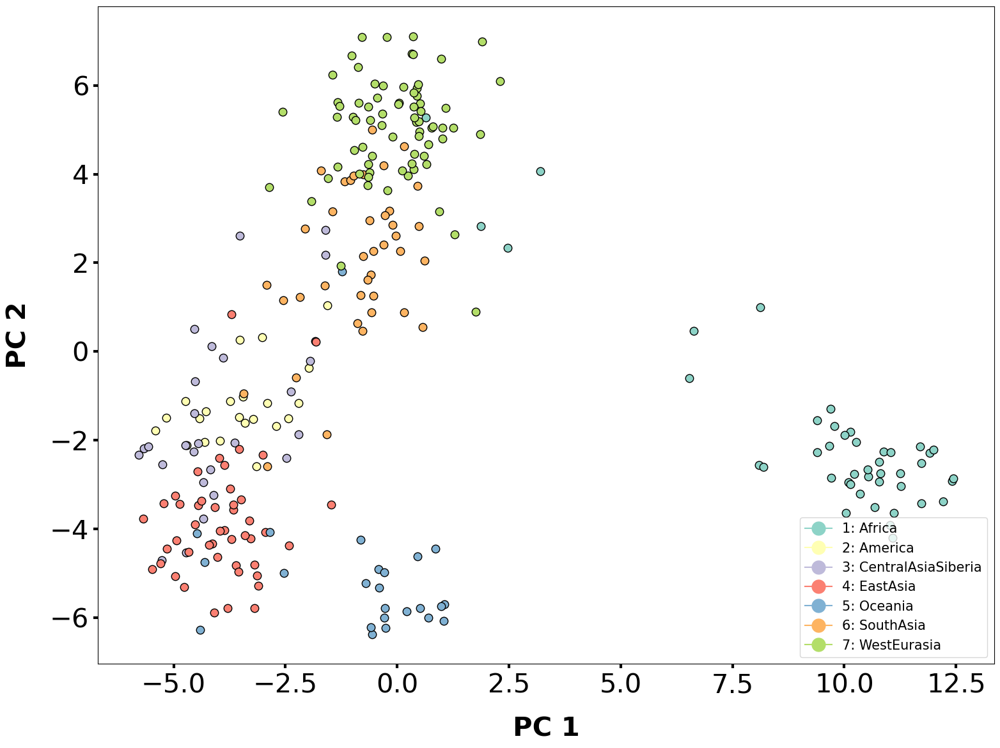

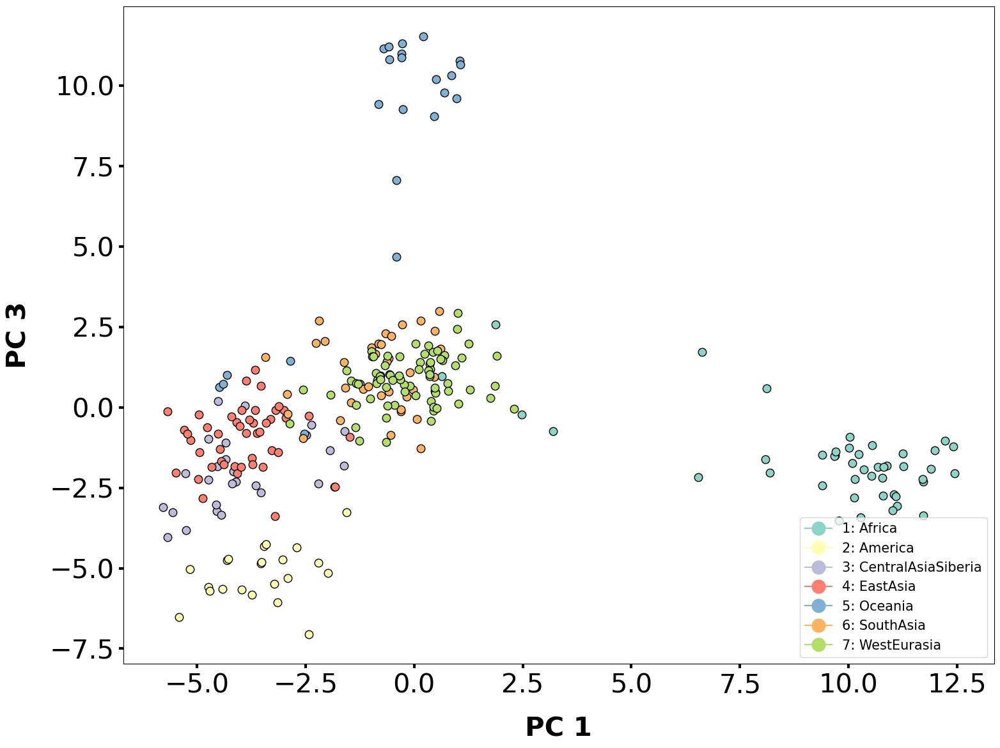

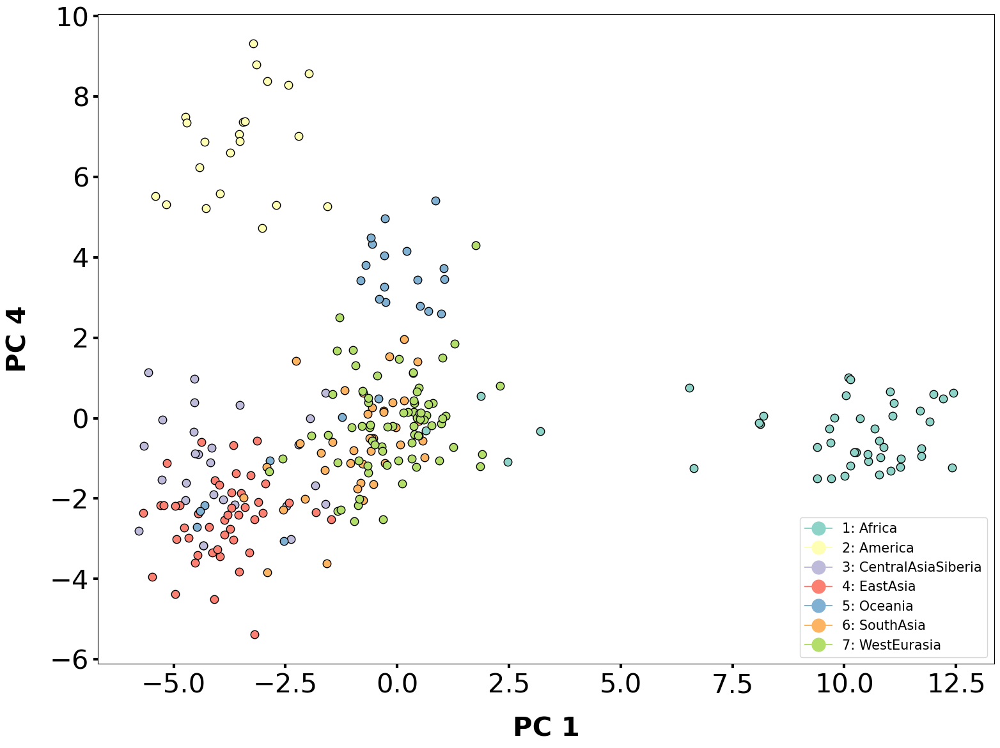

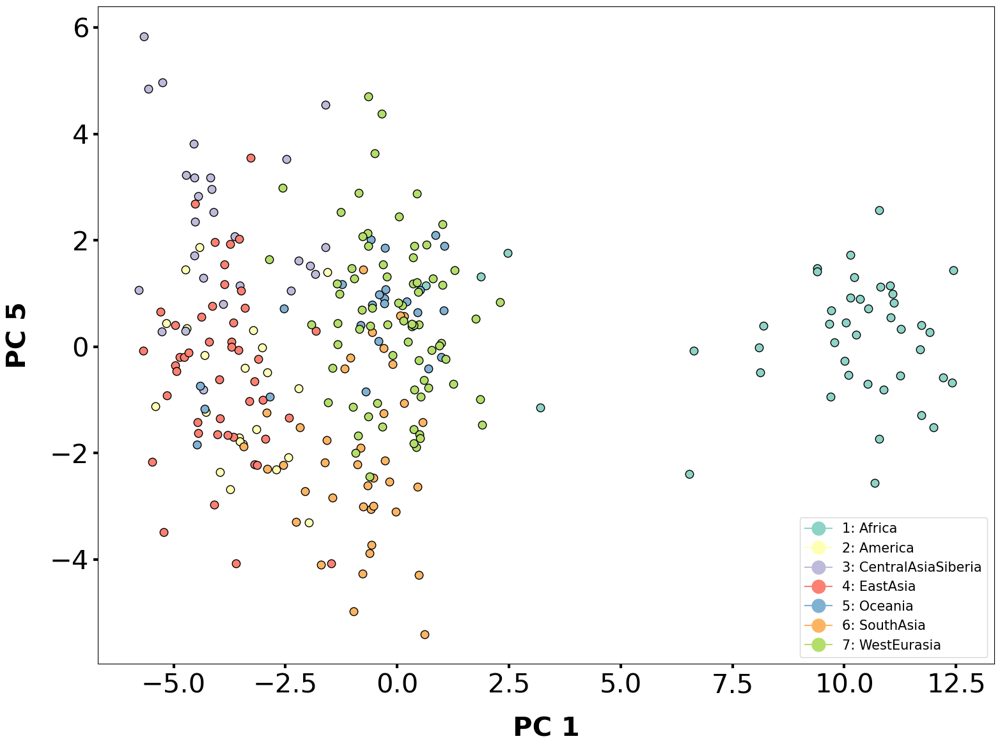

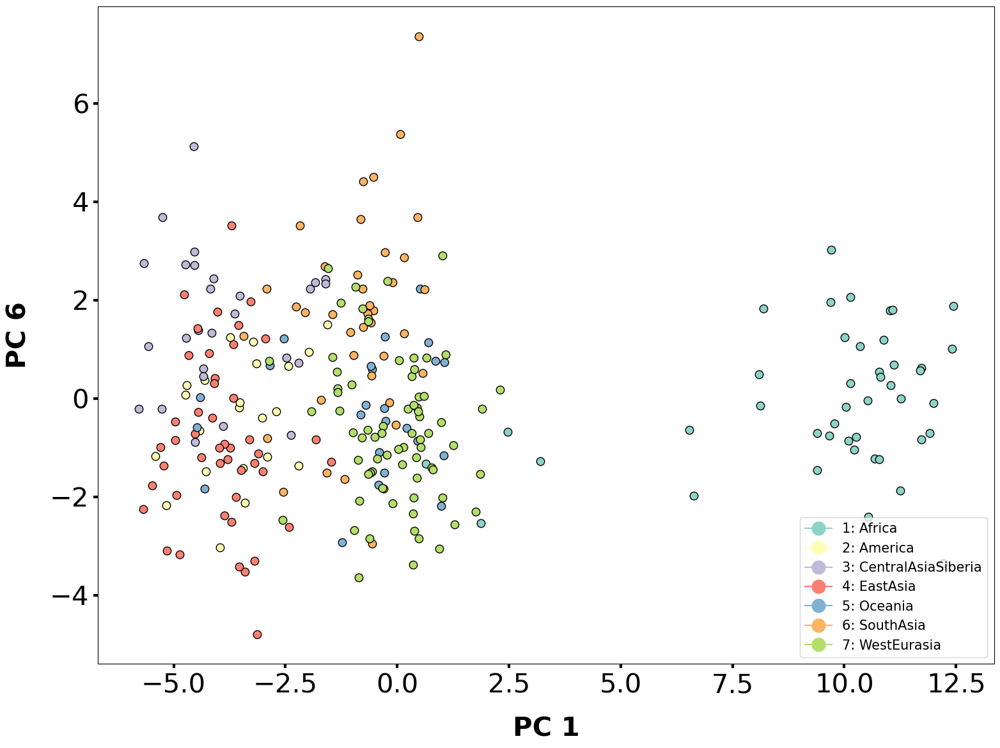

...

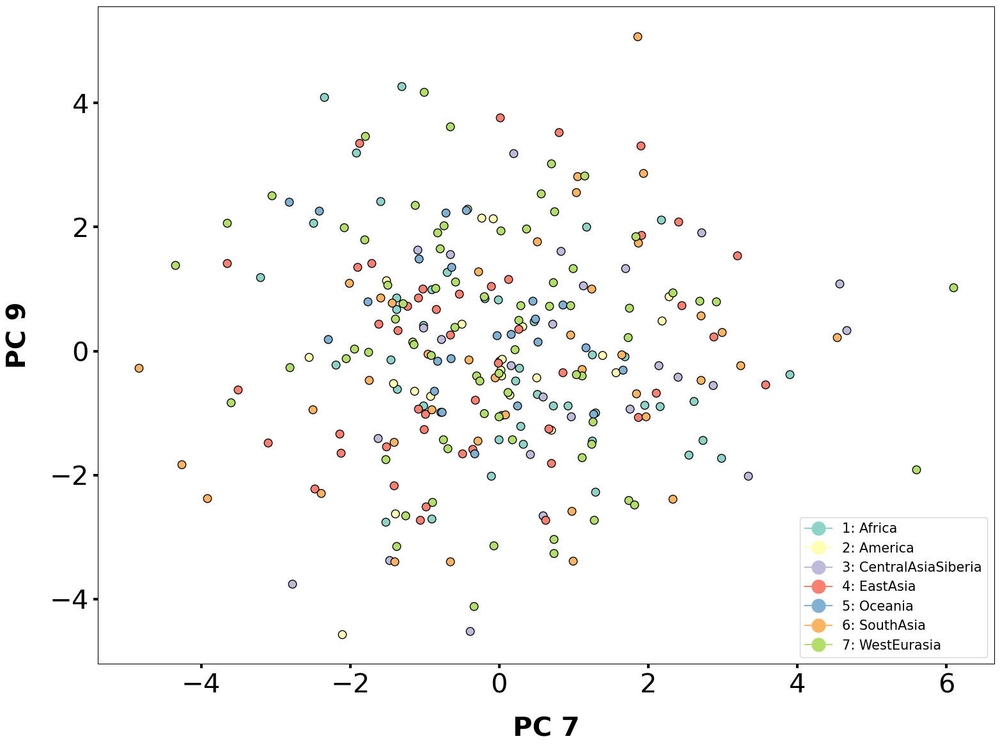

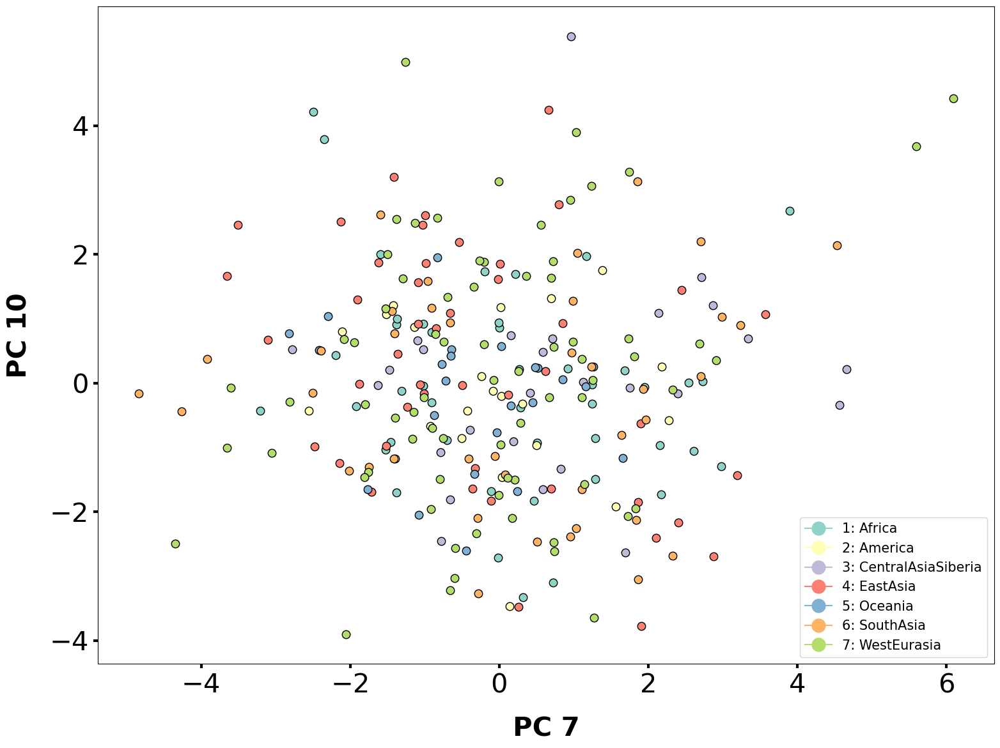

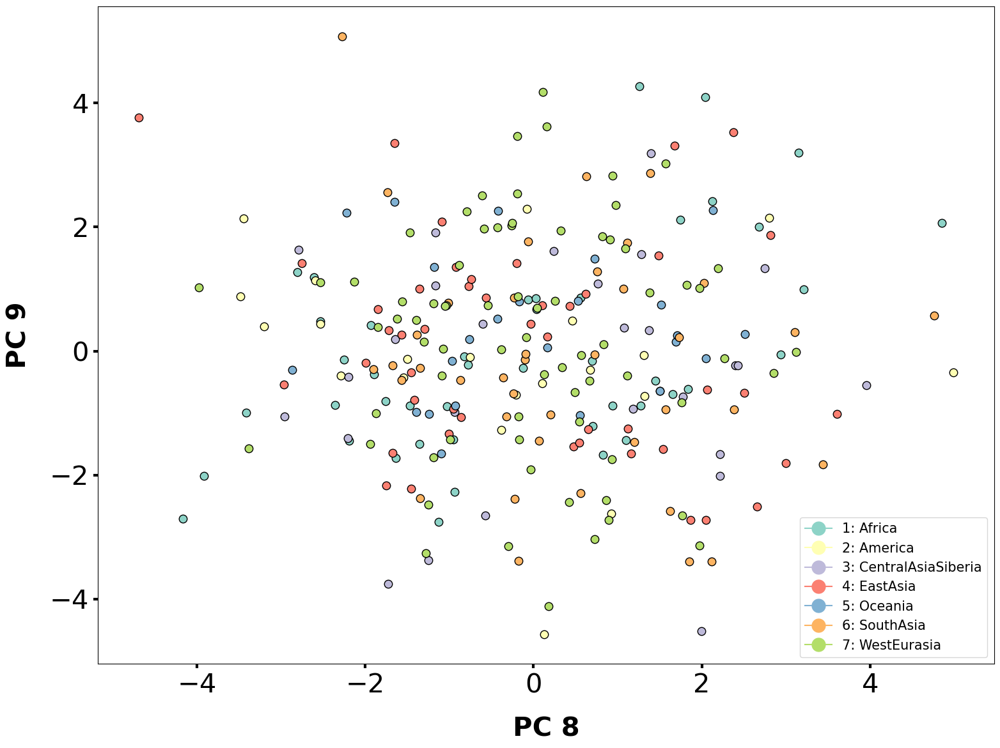

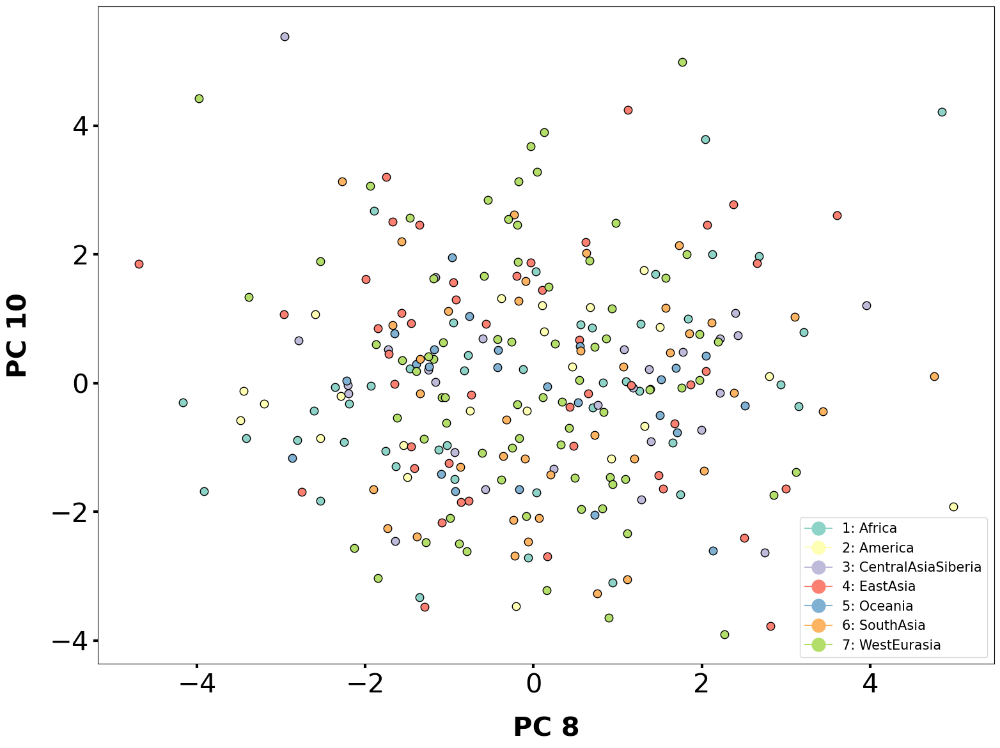

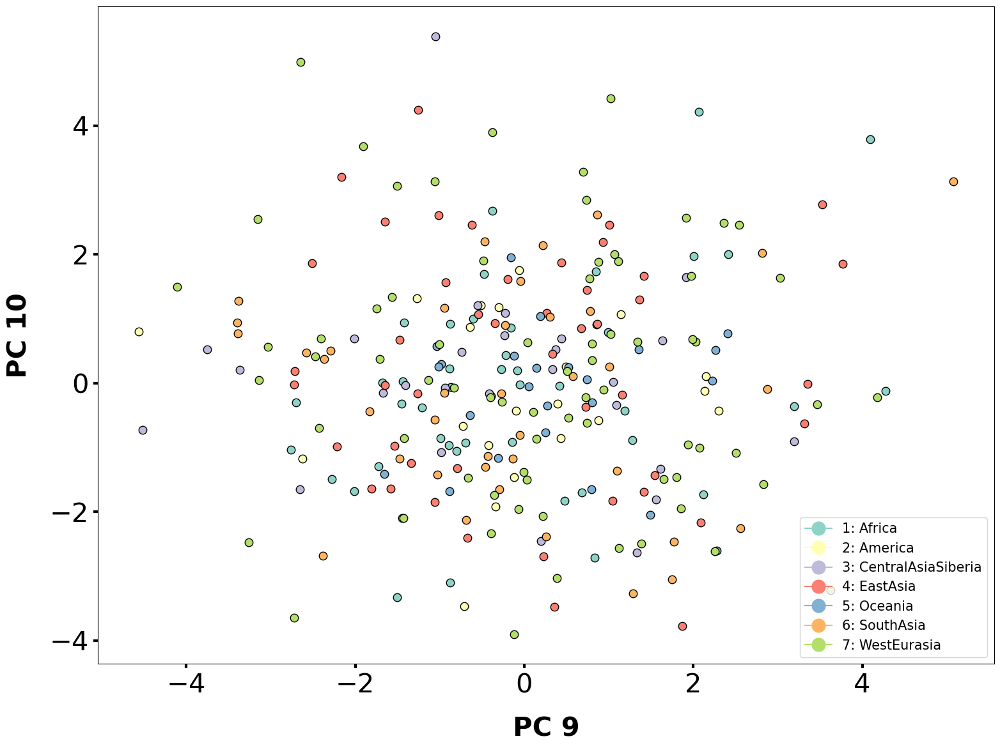

In [72]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

In [ ]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (6.53%)', label_vertical='PC2 (3.72%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA deletions")

plt.savefig('../plots/grch37_pca_deletions_pc12.png', transparent=True)

In [ ]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (3.72%)', label_vertical='PC3 (3.37%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA deletions")

plt.savefig('../plots/grch37_pca_deletions_pc23.png', transparent=True)

<h1> Duplications

In [ ]:
cnv_passed_vst = cnvs.T.iloc[vst_dt_filtering_location.index]
#cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<5).all(axis=1)]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]>1).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts = counts.fillna(2)
counts = counts.sort_index()
counts


In [ ]:
features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 

In [ ]:
#PCA
pca = PCA(n_components=2)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

In [ ]:
components = [1,2,3,4,5]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

In [ ]:
pca.explained_variance_ratio_

In [ ]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (42.55%)', label_vertical='PC2 (24.61%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA duplications")

plt.savefig('../plots/grch37_pca_duplications_pc12.png', transparent=True)

In [ ]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (24.61%)', label_vertical='PC3 (15.99%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA duplications")

plt.savefig('../plots/grch37_pca_duplications_pc23.png', transparent=True)

<h1> Dmean results 

In [ ]:
dmean_hg19 = pd.read_csv('dmean_hg19_results.csv')
dmean_hg19 = dmean_hg19.iloc[:,3:24]
dmean_hg19

In [ ]:
dmean_hg19_permutation = pd.read_csv('dmean_permutation_results.csv').set_index('Unnamed: 0')
dmean_hg19_permutation# = dmean_hg19_permutation.iloc[:,3:8655]

dmean_hg19_permutation.index.name = None
dmean_hg19_permutation

In [ ]:
filtering_dmean = pd.DataFrame(dmean_hg19.T)>=0.5
filtering_dmean = filtering_dmean.loc[:, filtering_dmean.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_dmean


In [ ]:
dmean_boolean = (dmean_hg19_permutation<=0.05)

dmean_boolean.columns = dmean_boolean.columns.astype(int) 

## Deleting columns where none of the regions passed the imputation
dmean_boolean = dmean_boolean.loc[:, dmean_boolean.any()]
dmean_boolean 



In [ ]:
# DMEAN RESULTS 
inner_vst = len(pd.concat([filtering_dmean.T, dmean_boolean.T],join='inner', axis=1))
left_vst = len(filtering_dmean.T) - inner_vst
right_vst = len(dmean_boolean.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Dmean', 'Permutation'))
plt.title('CNVs that passed Dmean and Permutation')
plt.show()

In [ ]:
passed_dmean_cnvs = pd.concat([filtering_dmean.T, dmean_boolean.T],join='inner', axis=1)
passed_dmean_cnvs

<h1> Overlapped CNVs that passed Vst and Dmean that also passed the permutation 

In [ ]:
vst_and_dmean_cnvs = pd.concat([filtering_vst.T, passed_dmean_cnvs],join='inner', axis=1)
vst_and_dmean_cnvs

In [ ]:
# DMEAN & VST RESULTS 
inner_vst = len(vst_and_dmean_cnvs)
left_vst = len(filtering_dmean.T) - inner_vst
right_vst = len(filtering_vst.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Dmean', 'Vst'))
plt.title('CNVs that overlap results from Vst and Dmean')
plt.show()

In [ ]:
input_liftover = candidates574.iloc[:,0:3]
input_liftover['chr'] = ('chr' + input_liftover['chr'])
input_liftover.to_csv('coordinates_574_candidates.bed', sep='\t', header=False, index=False)